<div style="text-align: center">
  <img src="https://www.dropbox.com/scl/fi/si9lbstdo0krwjf6i4y7j/Image-Patches-Sliding.gif?rlkey=cvk0381vn41m5rzwuxgymn431&st=w83cnbt9&dl=1" alt="Image">
</div>


## Installing Dependencies

In [ ]:
# !pip install -qq torch torchvision kaggle

In [ ]:
!sudo apt-get install tree
!sudo apt-get install unzip -y

In [ ]:
!kaggle datasets download -d ubiratanfilho/sds-dataset

In [ ]:
!unzip -qq ./sds-dataset.zip -d .

In [ ]:
!tree --dirsfirst -L 2  "./compressed"

## Import Dependencies

In [1]:
import os
import gc
import json
import math
import random
import requests
import zipfile
import numpy as np
from PIL import Image, ImageDraw, ImageFont, ImageOps, ImageStat
import PIL
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Patch
import logging
from tqdm import tqdm
import torch

Let’s set the seed for reproducibility.

In [2]:
def set_seeds():
    # fix random seeds
    SEED_VALUE = 42

    random.seed(SEED_VALUE)
    np.random.seed(SEED_VALUE)
    torch.manual_seed(SEED_VALUE)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(SEED_VALUE)
        torch.cuda.manual_seed_all(SEED_VALUE)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True
set_seeds()

## Understanding the Dataset

<div style="text-align: center">
  <img src="https://www.dropbox.com/scl/fi/56b1o15slxe1p3e83mulc/Drone_Metdata_1.gif?rlkey=t8rd823qb7m1gszwvjlh0tmmp&st=dmjr1x2l&dl=1" alt="Image">
</div>


- Imagine a scenario where a drone soared over the ocean, searching for survivors. That's the goal behind SeaDronesSee, a massive dataset designed to train computer vision systems for Search and Rescue (SAR) missions.
This dataset is like a training ground for embedded computer vision. It contains real-world video footage of maritime environments, where the challenge is to spot people in the water.


SeaDronesSee is split into three sections:
* Object Detection: This teaches the system to identify objects like people in the ocean's vastness.
* Single-Object Tracking: Once a person is spotted, the system learns to follow them, even if they move around.
* Multi-Object Tracking: There might be multiple survivors in a real SAR mission. This section trains the system to track them all simultaneously.
  
By analyzing this data, drones become more adept at assisting SAR missions, making them smarter lifesavers.
This article focuses on the object detection v2 subset of the SeaDroneSee dataset.

This subset contains images of 
* 8930 train
* 1547 val
* 3750 test
  
A key challenge in this type of dataset is achieving accurate identification with labels for objects, especially since many classes are quite small and difficult to detect.



Classes:

   * 0: 'ignored', 
   * 1: 'swimmer', 
   * 2: 'boat',
   * 3: 'jetski',
   * 4: 'life_saving_appliances',
   * 5: "buoy"

   
The “ignore” regions, which indicates regions containing objects that are difficult to be annotated due to low resolution or crowd or are unwanted in the dataset.


#### Class Mapping

Let's do a class mapping and assign a unique color for each label or class ID,

In [3]:
classes_to_idx = {
    0: 'ignored',
    1: 'swimmer',
    2: 'boat',
    3: 'jetski',
    4: 'life_saving_appliances',
    5: "buoy"
}

# Mapping category IDs to colors
category_colors = {
    0: 'black',   # ignored
    1: 'red',     # swimmer
    2: 'orange',   # boat
    3: 'blue',    # jetski
    4: 'purple',  # life saving appliances
    5: 'yellow'   # buoy
}

**Class Distribution Plotting**

We also observe that this dataset is imbalanced, with a significant class distribution discrepancy between small object instances such as swimmers, buoys, and life-saving appliances.

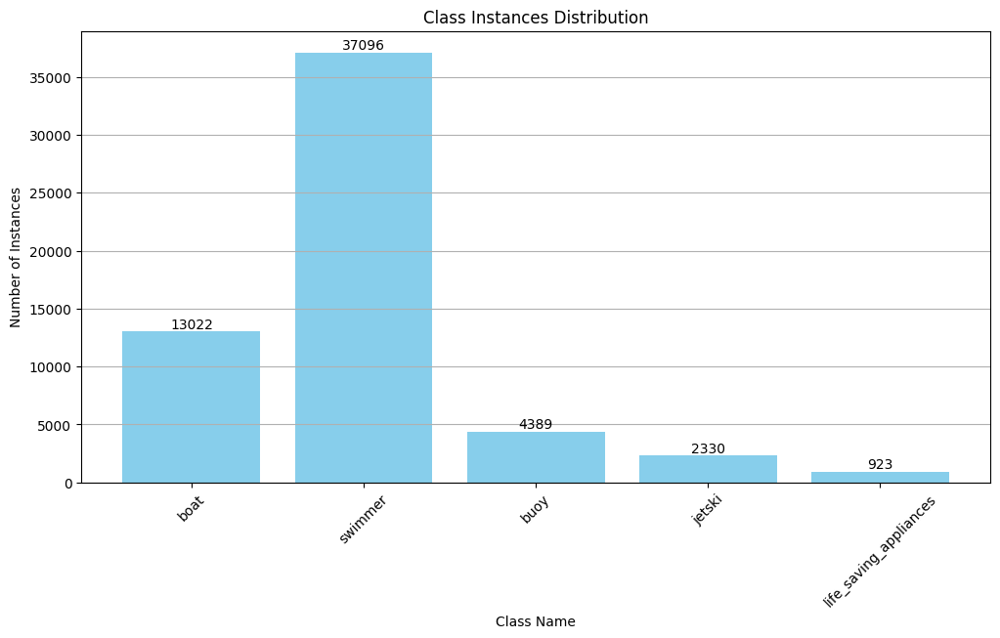

In [4]:
import json
import matplotlib.pyplot as plt
from collections import Counter

# Path to the annotation file
annotation_path = './compressed/annotations/instances_train.json'

# Load annotations from JSON file
def load_annotations(annotation_path):
    with open(annotation_path, 'r') as file:
        annotations = json.load(file)
    return annotations

# Count the instances of each category
def count_class_instances(annotations):
    category_counts = Counter()
    for annot in annotations['annotations']:
        category_id = annot['category_id']
        category_counts[category_id] += 1
    return category_counts


# Plot the class instance distribution
def plot_class_distribution(category_counts):
    categories = list(category_counts.keys())
    counts = list(category_counts.values())
    class_names = [classes_to_idx[cat] for cat in categories]

    plt.figure(figsize=(12, 6))
    bars = plt.bar(class_names, counts, color='skyblue')
    plt.xlabel('Class Name')
    plt.ylabel('Number of Instances')
    plt.title('Class Instances Distribution')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.grid(axis='y')

    # Annotate bars with counts
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(count),
                 ha='center', va='bottom')

    plt.show()

# Main function to load annotations, count class instances, and plot distribution
def visualize_class_distribution(annotation_path):
    annotations = load_annotations(annotation_path)
    category_counts = count_class_instances(annotations)
    plot_class_distribution(category_counts)

# Execute the visualization function
visualize_class_distribution(annotation_path)



Understanding the dataset is a crucial step in any deep-learning task. So, we will spend a good amount of time here on some preprocessing techniques for this dataset. 

To inspect and visualize the ground truth annotations, let’s define draw_bounding_boxes' utility. 
One of the key aspects in object detection is the bounding box format, which can hamper our fine-tuning Faster RCNN pipeline if not properly handled. Our dataset annotations are in XYWH format, so we will convert them to XYXY, which is the expected format of PIL’s Image Draw function.


In [5]:
def draw_bounding_boxes(image, bboxes):
    draw = ImageDraw.Draw(image)
    font_size = int(min(image.size) * 0.02)  # Adjust font size based on image size
    font_path = "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf"
    font = ImageFont.truetype(font_path, font_size) if os.path.exists(font_path) else ImageFont.load_default()

    for bbox, category_id in bboxes:
        x, y, w, h = bbox
        x1, y1, x2, y2 = x, y, x + w, y + h
        color = category_colors.get(category_id, 'white')  # Default to white if category_id is unknown
        draw.rectangle([x1, y1, x2, y2], outline=color, width=4)
        draw.text((x1, y1 - font_size), str(category_id), fill=color, font=font)

    return image


The load_annotations utility takes the path of instances_train.json or instaces_val.json to load them and returns their annotations. 


In [6]:
def load_annotations(annotation_path):
    with open(annotation_path, 'r') as f:
         annotations = json.load(f)
    return annotations

After loading, we will iterate over each bounding box with their image ID from the annotations, and using matplotlib, we will plot the ground truth with an arbitrary number of samples of our choice.


In [7]:
def visualize_samples(image_dir, annotation_path, num_samples=5):
    annotations = load_annotations(annotation_path)
    images_info = annotations['images']
    bboxes_info = annotations['annotations']

    images_with_bboxes = {}
    for bbox in bboxes_info:
        image_id = bbox['image_id']
        if image_id not in images_with_bboxes:
            images_with_bboxes[image_id] = []
        images_with_bboxes[image_id].append((bbox['bbox'], bbox['category_id']))

    # Shuffle list of images
    random.shuffle(images_info)

    # Visualize samples
    plt.figure(figsize=(15, num_samples * 5))
    sample_count = 0
    for image_info in images_info:
        if sample_count >= num_samples:
            break
        image_path = os.path.join(image_dir, image_info['file_name'])
        if not os.path.exists(image_path):
            continue  # Skip this image if the file does not exist
        image = Image.open(image_path)
        image_id = image_info['id']
        # print(f"Img ID: {image_id} Image Dimension: {image.size}")
        if image_id in images_with_bboxes:
            bboxes = images_with_bboxes[image_id]
            image = draw_bounding_boxes(image, bboxes)

        plt.subplot(num_samples, 1, sample_count + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Image ID: {image_id}")
        sample_count += 1

    plt.tight_layout()
    plt.show()

Training sample visualisation

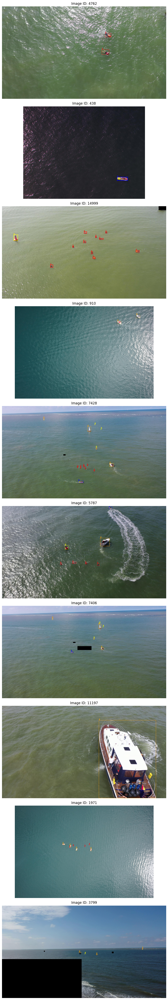

In [9]:
image_dir = './compressed/images/train'
annotation_path = './compressed/annotations/instances_train.json'

visualize_samples(image_dir,annotation_path,num_samples=10)

Validation sample visualisation

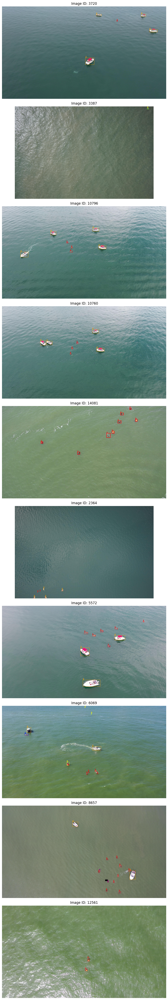

In [10]:
image_dir = './compressed/images/val'
annotation_path = './compressed/annotations/instances_val.json'

visualize_samples(image_dir,annotation_path,num_samples=10)

Image sizes of dataset (w,h):

* (5436,3632)
* (3840,2160)
* (1230,932)
* (1231,933)
* (3632,5456)
* (1920,1080)


In [11]:
widths = [5436, 3840, 1230, 1231, 3632, 1920]
heights = [3632, 2160, 932, 933, 5456, 1080]
median_width = sorted(widths)[len(widths) // 2]
median_height = sorted(heights)[len(heights) // 2]
print("Median Width: ",median_width)
print("Median Height: ",median_height)

Median Width:  3632
Median Height:  2160


### Data Cleaning

Let’s inspect the entire train and val image samples with their ground truth annotation plotted and save them for visual inspection.


In [ ]:
# Directories
image_dir = 'compressed/images/train'
output_dir = 'compressed/train_gt/bbox_ann_images'
annotation_path = 'compressed/annotations/instances_train.json'


# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)


# Process all images according to annotations
def process_and_save_annotated_images(image_dir, output_dir, annotations):
    image_annotations = {}
    for annot in annotations['annotations']:
        image_annotations.setdefault(annot['image_id'], []).append(annot)


    for image_id, annots in image_annotations.items():
        image_path = os.path.join(image_dir, f"{image_id}.jpg")
        if os.path.exists(image_path):
            image = Image.open(image_path)
            annotated_image = draw_bounding_boxes(image, annots, category_colors)  # Pass all annotations for the image
            output_image_path = os.path.join(output_dir, f"annotated_{image_id}.jpg")
            annotated_image.save(output_image_path)
            print(f"Saved annotated image to {output_image_path}")

# Load annotations
annotations = load_annotations(annotation_path)

# Annotate and save images
process_and_save_annotated_images(image_dir, output_dir, annotations)

Remove Unwanted Images:

This dataset contains synthetic scenes and by closely observing, it was found that around 73 samples of moving objects had their bounding box annotations offset or were wrong. So, we will manually remove them by their filenames, as this will introduce noise into the fine-tuning Faster R-CNN model. 

<div style="text-align: center">
  <img src="https://www.dropbox.com/scl/fi/1oo40gw7d8egyu5v6clny/offset_annotated_5540.jpg?rlkey=bfzur0zk4vy5b89tdlu5l2z86&st=7q76ampy&dl=1" alt="Image" width=500 height=330>
</div>



In [ ]:

# List of file names to remove
train_file_remove_list = [
    3391, 3392, 3393, 3413, 3414, 3415, 3416, 3417, 6952, 6957, 7002, 7000, 6999, 7023, 7046, 7093, 7092, 7091,
    7527, 7558, 7611, 7631, 7987, 7988, 8091, 8097, 8098, 8099, 8113, 8114, 8422, 8438, 8441, 8443, 10246,
    10260, 10263, 10264, 10265, 10266, 10269, 10271, 10330, 10348, 10369, 10368, 10379, 11785, 11814, 11828,
    11862, 11865, 11869, 11877, 11887, 11891, 11908, 11910, 12001, 12003, 12195, 12312, 12327, 12332, 12417,
    13035, 15809, 15808, 15913, 15914, 16140, 16270, 16271
]

val_file_remove_list = [10465]

# Directory containing the images
image_dir = './compressed/images/train'

# Iterate over the file list and attempt to remove each file
for file_id in train_file_remove_list:
    file_path = os.path.join(image_dir, f"{file_id}.jpg")
    if os.path.exists(file_path):
        try:
            os.remove(file_path)
            print(f"Removed: {file_path}")
        except OSError as e:
            print(f"Error removing {file_path}: {e}")
    else:
        print(f"File does not exist: {file_path}")


## Patch Creation

* In our dataset, each image is of 4k high resolution. These high-res pose challenges due to their sheer size, which can shoot up the computational resources and memory capacity. By dividing these images into patches and saving them, we can process those smaller sections independently, thus reducing the computational load and enabling the model to focus on finer details. This is particularly beneficial in our use case of detecting small objects, such as swimmers or boats at very distant points in the vast ocean.

* In our approach, we utilize a patch overlap ratio of 0.2. This overlap ensures that no critical information is lost between patches. By having overlapping regions, the model can learn from multiple perspectives of the same area and learn the distinguishing features of these objects. Furthermore, patch creation allows for increased data augmentation, effectively increasing the number of training samples.
Now, the small object detection problem has became typical object detection problem. That sounds pretty intuitive, right? 


As discussed earlier, we will ignore instance annotations within the bounds of a masked cutout of some images. We tackle this by taking an averaged color of pixels within the bbox that exists inside the ground truth on the area of the masked cutout, thus ignoring those bboxes from the annotation file.

In [12]:
def is_bbox_ignored(image, bbox, threshold=10):
    """Check if the entire region inside a bounding box is predominantly black.

    Args:
        image (PIL.Image): The image to check.
        bbox (list): The bounding box [x, y, width, height].
        threshold (int): The threshold below which a region is considered black.

    Returns:
        bool: True if the region is predominantly black, False otherwise.
    """
    x, y, w, h = bbox
    cropped_image = image.crop((x, y, x + w, y + h))
    stat = ImageStat.Stat(cropped_image)
    avg_color = stat.mean  # Average color (R, G, B)

    # Check if all color channels are below the threshold
    return all(channel < threshold for channel in avg_color)

**Let's also handle h>w ,so that to make the aspect ratio uniform as w>h**

To maintain consistency of w>h  across the data loader, we will convert images whose height aspect is greater than width to that of images with width greater than height.

If an image has h>w, then using PIL, we will rotate the image 90 degrees anticlockwise and pad the remaining regions if necessary to maintain the aspect ratio using expand = True.


In [13]:
def check_and_rotate_image(image):
    """Rotate the image if its height is greater than its width and return the image and a flag indicating rotation."""
    width, height = image.size
    if height > width:
        image = image.rotate(90, expand=True)  # Rotates 90 counter-clockwise
        return image, True
    return image, False

The following is a crucial step in which the bbox is adjusted according to the rotation of the image. As we rotate the image anticlockwise, the new dimensions are adapted relatively.


In [15]:
def adjust_bbox_for_rotation(bbox, image_width, image_height):
    """Adjust bounding boxes for 90 degree counter clockwise rotation."""
    x, y, w, h = bbox
    new_x = y
    new_y = image_width - (x + w)
    new_w = h
    new_h = w
    return [new_x, new_y, new_w, new_h]

In [17]:
def rotate_image_and_adjust_bbox(image, annotations, original_dims):
    """Rotate image and adjust bounding boxes accordingly."""
    rotated_image = image.rotate(90, expand=True)
    new_annotations = []
    original_width, original_height = original_dims

    for ann in annotations:
        x, y, w, h = ann['bbox']
        new_x = y
        new_y = original_width - (x + w)
        new_w = h
        new_h = w
        new_ann = ann.copy()
        new_ann['bbox'] = [new_x, new_y, new_w, new_h]
        new_annotations.append(new_ann)

    return rotated_image, new_annotations

Next, the main aspect of our preprocessing is the patch creation logic. We understood this earlier intuitively; now, let’s implement it in code.

This function will create a patch whose dimensions are half the size of the image and have a 0.2 overlap ratio. As a result of sliding over the images, we will get four patches. These patches are saved, and their coordinate positions (left, top, right, bottom) are returned. These are required to adjust the bounding box relative to each patch from the single big image.




In [14]:
def create_patches(image, output_dir, image_filename, overlap_ratio=0.2):
    """Create image patches and handle image rotation if necessary."""
    image, was_rotated = check_and_rotate_image(image)
    width, height = image.size

    patch_width = int(width / 2)
    patch_height = int(height / 2)
    overlap_width = int(patch_width * overlap_ratio)
    overlap_height = int(patch_height * overlap_ratio)

    patches = []
    for i in range(2):  # Three rows
        for j in range(2):  # Three columns
            left = i * (patch_width - overlap_width)
            top = j * (patch_height - overlap_height)
            right = left + patch_width
            bottom = top + patch_height
            patch = image.crop((left, top, right, bottom))
            patch_filename = f'{os.path.splitext(image_filename)[0]}_{i}_{j}.jpg'
            patch_path = os.path.join(output_dir, patch_filename)
            patch.save(patch_path)
            patches.append((patch_filename, left, top, right, bottom, was_rotated))

    return patches


These bounding boxes are then adjusted with respect to the patch coordinates. We clamp these values to ensure the new annotations are not beyond the patch dimension. We also ensure no non-positive bounding box values will be saved.


In [16]:
def adjust_bbox_for_patch(bbox, patch_coords):
    """Adjust the bounding box to the coordinates of the patch with enhanced error handling."""
    left, top, right, bottom = patch_coords
    x, y, w, h = bbox
    x1, y1, x2, y2 = x, y, x + w, y + h

    logging.debug(f"Original bbox: {bbox}")
    logging.debug(f"Patch coordinates: {patch_coords}")

    # Ensure the bounding box intersects with the patch
    if x2 <= left or x1 >= right or y2 <= top or y1 >= bottom:
        # logging.warning("Bounding box does not intersect with the patch.")
        return None  # No intersection

    # Clamp the bounding box to the patch boundaries
    clamped_x1 = max(x1, left)
    clamped_y1 = max(y1, top)
    clamped_x2 = min(x2, right)
    clamped_y2 = min(y2, bottom)

    adjusted_width = clamped_x2 - clamped_x1
    adjusted_height = clamped_y2 - clamped_y1

    # Check for non-positive dimensions
    if adjusted_width <= 0 or adjusted_height <= 0:
        logging.warning("Adjusted bounding box has non-positive dimensions.")
        return None

    # Check if adjusted bounding box exceeds patch size
    if adjusted_width > (right - left) or adjusted_height > (bottom - top):
        logging.warning("Adjusted bounding box exceeds patch dimensions.")
        return None

    adjusted_bbox = [clamped_x1 - left, clamped_y1 - top, adjusted_width, adjusted_height]
    logging.debug(f"Adjusted bbox: {adjusted_bbox}")

    return adjusted_bbox

The following function combines all the annotation utilities and returns the instance annotations within each patch. 



In [18]:
def get_annotations_for_patches(image, annotations, patches, original_image_id):
    """Adjust annotations for each patch."""
    patch_annotations = []
    annotation_id = 0

    for patch_filename, left, top, right, bottom, was_rotated in patches:
        patch_coords = (left, top, right, bottom)
        patch_annots = []

        for ann in annotations:
            if ann['image_id'] != original_image_id:
                continue

            bbox = ann['bbox']
            if was_rotated:
                bbox = adjust_bbox_for_rotation(bbox, right - left, bottom - top)

            # Check if the bbox should be ignored
            if is_bbox_ignored(image, bbox):
                continue

            adjusted_bbox = adjust_bbox_for_patch(bbox, patch_coords)
            if adjusted_bbox:
                new_ann = {
                    "id": annotation_id,
                    "image_id": patch_filename,
                    "bbox": adjusted_bbox,
                    "area": (adjusted_bbox[2] * adjusted_bbox[3]),
                    "category_id": ann['category_id']
                }
                patch_annots.append(new_ann)
                annotation_id += 1

        if patch_annots:
            patch_annotations.extend(patch_annots)

    return patch_annotations

Now, it’s time to integrate all these preprocessing steps, starting with reading annotation files, iterating over them, rotating the image dimension, creating patches, and finally adjusting the bounding box and saving them to an output directory for both training and validation set.



In [19]:
def process_images_and_annotations(base_dir):
    annotation_files = ['instances_train.json','instances_val.json']
    image_dirs = ['train','val']

    all_new_annotations = {"annotations": []}

    for annotation_file, image_dir in zip(annotation_files, image_dirs):
        annotation_path = os.path.join(base_dir, 'annotations', annotation_file)
        with open(annotation_path, 'r') as f:
            annotations = json.load(f)

        for image_info in annotations['images']:
            image_filename = image_info['file_name']
            image_path = os.path.join(base_dir, 'images', image_dir, image_filename)
            if not os.path.exists(image_path):
                continue

            original_dims = (image_info['width'], image_info['height'])
            image = Image.open(image_path)
            if image_info['height'] > image_info['width']:
                rotated_image, image_annotations = rotate_image_and_adjust_bbox(image.copy(), annotations['annotations'], original_dims)
            else:
                rotated_image = image.copy()
                image_annotations = annotations['annotations']

            output_dir = os.path.join(base_dir, 'output_patches', 'images', image_dir)
            os.makedirs(output_dir, exist_ok=True)

            patches = create_patches(rotated_image, output_dir, image_filename)
            new_annotations = get_annotations_for_patches(rotated_image, image_annotations, patches, image_info['id'])
            all_new_annotations["annotations"].extend(new_annotations)

        annotation_dir = os.path.join(base_dir, 'output_patches', 'annotations')
        os.makedirs(annotation_dir, exist_ok=True)

    annotations_output_path = os.path.join(base_dir, 'output_patches', 'annotations', f'instances_patches_{image_dir}.json')
    with open(annotations_output_path, 'w') as f:
        json.dump(all_new_annotations, f, indent=4)

In [ ]:
base_dir = './compressed/'
process_images_and_annotations(base_dir)

<div style="text-align: center">
  <img src="https://www.dropbox.com/scl/fi/bm6iohg5raenid78n8lq4/Patch-samples-sample-output.png?rlkey=hn66qio2cn5ooibhocqf1x27o&st=jlh3hbn8&dl=1" alt="Image" width=400 height=400>
</div>





In [21]:
!tree --dirsfirst -L 2 "./compressed/output_patches"

./archive/compressed/output_patches
└── output_patches
    ├── annotations
    └── images

3 directories, 0 files


In [22]:
# Visualize samples
def visualize_patch_samples(image_dir, annotation_path, num_samples=5):
    annotations = load_annotations(annotation_path)
    images_with_bboxes = {}

    # Collecting image paths and their respective bounding boxes
    for annot in annotations['annotations']:
        image_id = annot['image_id']
        if image_id not in images_with_bboxes:
            images_with_bboxes[image_id] = []
        images_with_bboxes[image_id].append((annot['bbox'], annot['category_id']))

    # Select random samples to visualize
    sampled_images = random.sample(list(images_with_bboxes.keys()), min(num_samples, len(images_with_bboxes)))

    # Visualize samples
    plt.figure(figsize=(15, num_samples * 5))
    for i, image_id in enumerate(sampled_images):
        image_path = os.path.join(image_dir, image_id)
        if not os.path.exists(image_path):
            continue
        image = Image.open(image_path)
        # print(image.size)
        bboxes = images_with_bboxes[image_id]
        image = draw_bounding_boxes(image, bboxes)

        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Image ID: {image_id}")

    plt.tight_layout()
    plt.show()

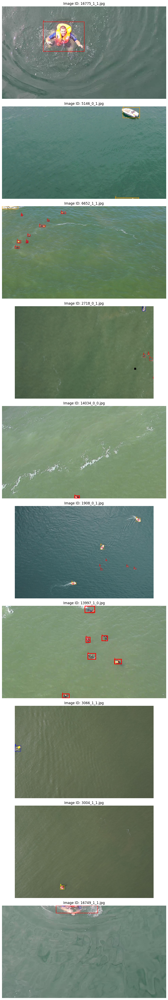

In [24]:
image_dir = './compressed/output_patches/images/val'
annotation_path = './compressed/output_patches/annotations/instances_patches_val.json'

visualize_patch_samples(image_dir,annotation_path,num_samples=10)